
|         Author        |   Email  |         Project         |
|---------------------------|-------------|-----------------------|
| **Emmanuel NYANDU KAGARABI**  |emmanuelnk@aims.ac.za |  `Oral Presentation in Computer Vision`     |


*******************************************************************************

# <font color='blue'>`Denoising Diffusion Models`</font>

*******************************************************************************


In [39]:
# @title
from IPython.display import Image
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


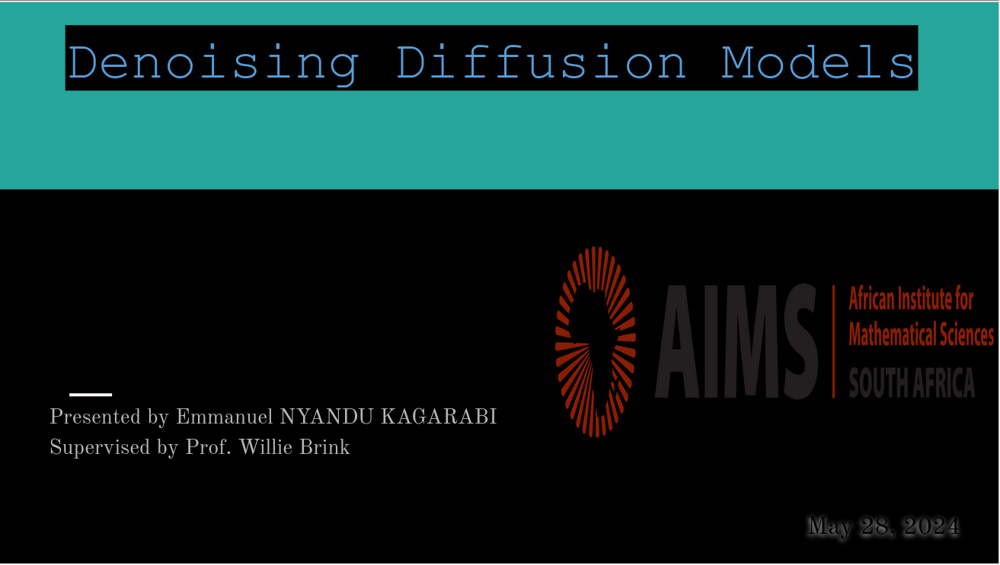

In [40]:
# @title
im1 = '/content/drive/MyDrive/COMPUTER_VISION/My_project_Diffusion_Models/FIGURES/page_garde.png'
Image(im1)

<font color='purple'>`Welcome to this notebook related to Diffusion Models.`</font>

# **1. Motivation**

`Denoising Diffusion Models(DDMs)`, also referred to as `score-based generative models` or `Diffusion models`, belong to a powerful class of recently emerged generative models.

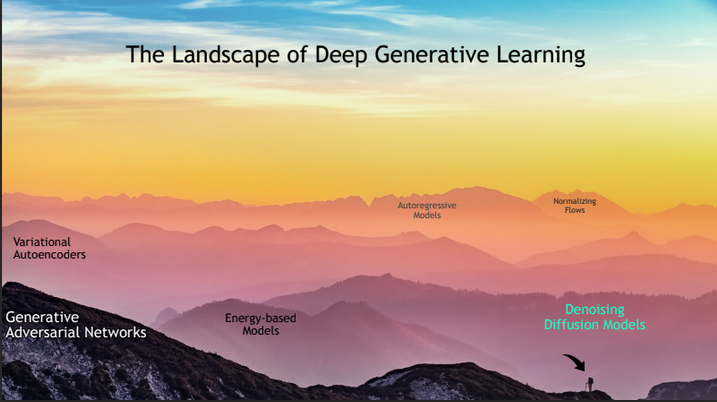

In [41]:
# @title
im2 = '/content/drive/MyDrive/COMPUTER_VISION/My_project_Diffusion_Models/FIGURES/land_scape_diffusion.png'
Image(im2)

 They have been recently and widely used in `Deep Learning` and `Generative AI`. They are used to `generate new samples` for training big models and to create new things.

- Applications (1): Image Synthesis, Text-to-Image, Controllable and Semantic Generation.

- Applications (2): Image Editing, Image-to-Image, Superresolution, Segmentation.

- Applications (3): Discrete State Models, 3D Generation, Medical Imaging, Video Synthesis.

- etc.

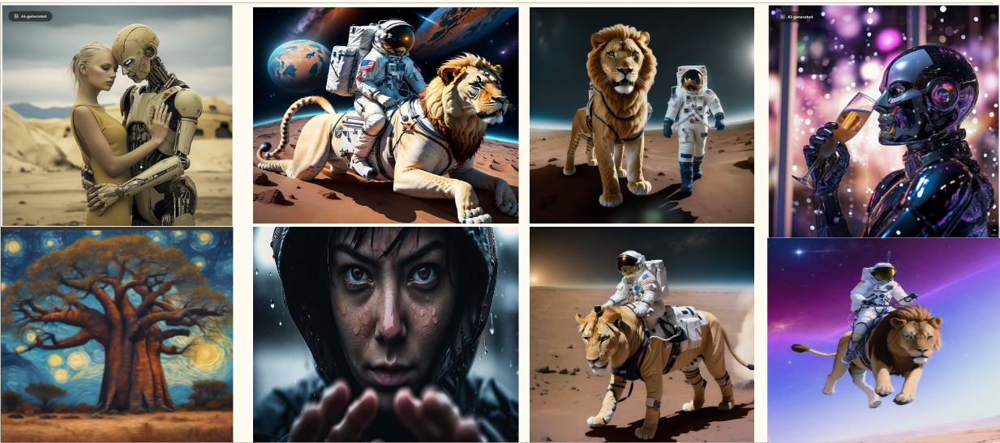

In [42]:
# @title
im3 = '/content/drive/MyDrive/COMPUTER_VISION/My_project_Diffusion_Models/FIGURES/motiv.png'
Image(im3)

“Person in the rain, close shot, raincoat”, “Cat in shining armour, silver finely detailed”,“An astronaut riding a lion on mars”, “A giant baobab tree, in the style of Starry Night painted by Van Gogh”.



The basic idea behind these models is based on the observation that `it is hard to convert noise
into structured data, but it is easy to convert structured data into noise.`

The goal of diffusion models is to learn a diffusion process that generates a probability distribution for a given dataset from which we can then sample new images.

# **2. Mathematics behind Diffusion Models**

**2.1. Keynote**

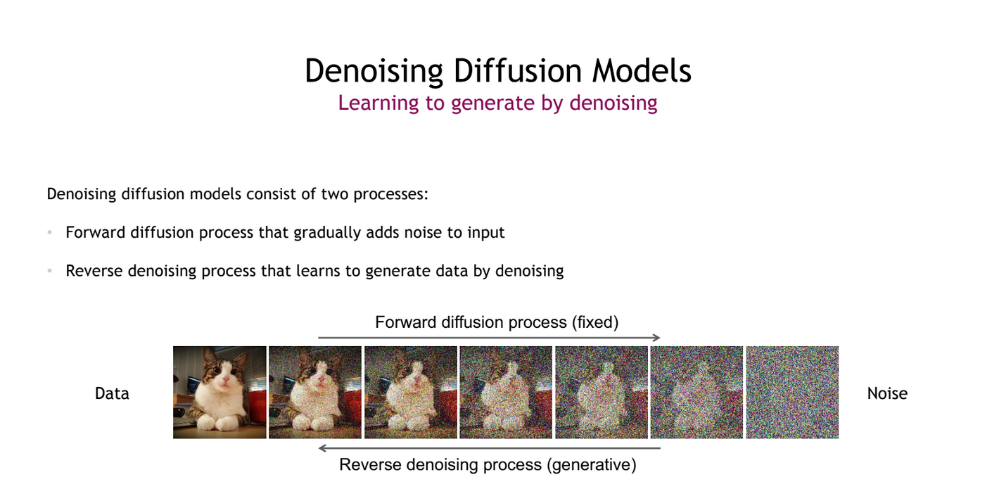

In [43]:
# @title
im4 = '/content/drive/MyDrive/COMPUTER_VISION/My_project_Diffusion_Models/FIGURES/steps.png'
Image(im4)

We use `forwards process` or `diffusion process` to gradually convert the observed data  $\mathbf{x}_0$ into a noisy version $\mathbf{x}_T$ by passing the data through $T$ steps of a stochastic encoder $q(\mathbf{x}_t |\mathbf{x}_{t−1} )$. After enough steps, we have $x_T\sim \mathcal{N} (0, I)$, or some other convenient reference distribution. We then learn a `reverse process` to undo this, by passing the noise through $T$ steps of a decoder $p_θ (\mathbf{x}_{t−1} |\mathbf{x}_t )$ until we generate $\mathbf{x}_0$ .

Diffusion models can be studied considering many perspectives. For example, one can define them in `discrete`  or `continous` time (here, `ODEs` and `PDEs` are used, we will note cover this aspect here ).  

**2.2. Encoder (Forward Diffusion process)**

Given a data point sampled from a real data distribution $\mathbf{x}_{0}\sim q(\mathbf{x})$, let us define a forward diffusion process in which we add small amount of Gaussian noise to the sample in $T$ steps, producing a sequence of `noisy samples`
$$\mathbf{x}_{1},\cdots,\mathbf{x}_{T}. $$
The step sizes are controlled by a variance schedule $$\left\{ \beta_t\in(0,1)\right\}_{t=1}^{T}. $$



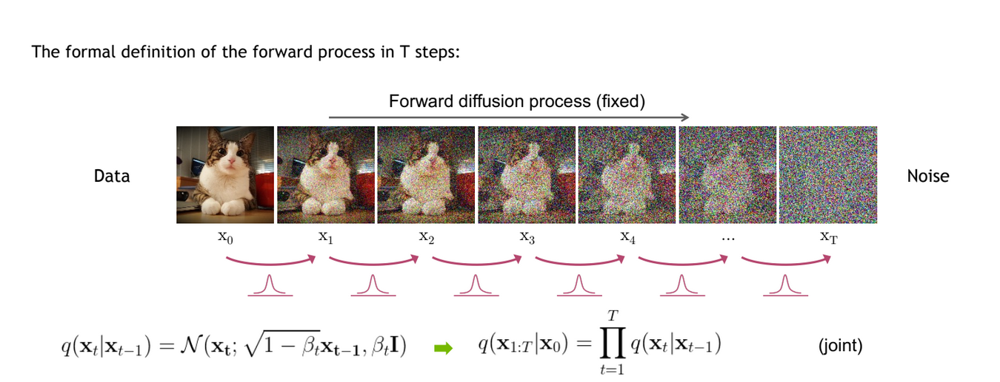

In [44]:
# @title
im5 = '/content/drive/MyDrive/COMPUTER_VISION/My_project_Diffusion_Models/FIGURES/f1.png'
Image(im5)

The data sample $\mathbf{x}_0$ gradually loses its distinguishable features as the step $t$ becomes larger.
 Eventually when $T\rightarrow\infty$, $\mathbf{x}_T$ is equivalent to a Gaussian distribution. $T$ is an `hyperparameter`.

The diffusion process is built based on a variance schedule, which determines the levels of added noise at each step of the process. To that end, the schedule is defined below, with the following quantities:

* `betas`:$\beta_t$, (with $\beta_1<\beta_2<\cdots<\beta_T$)


* `alphas`: $\alpha_t=1-\beta_t$


* `alphas_sqrt`:  $\sqrt{\alpha_t}$


* `alphas_prod`: $\bar{\alpha}_t=\prod_{i=1}^{t}\alpha_i$, , (with $\bar{\alpha}_1<\bar{\alpha}_2<\cdots<\bar{\alpha}_T$)

* `alphas_prod_sqrt`: $\sqrt{\bar{\alpha}_t}$

We can also directly sample $\mathbf{x}_t \sim q(\mathbf{x}_t|\mathbf{x}_0)$ given $\mathbf{x}_0$.

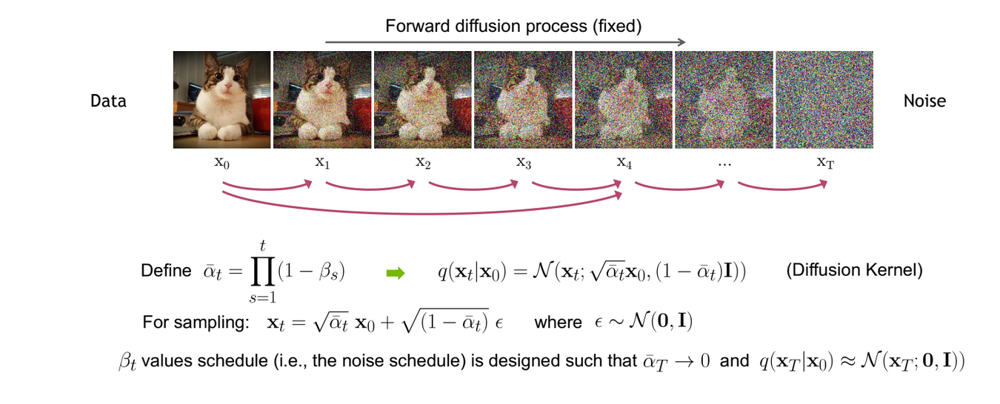

In [45]:
# @title
im6 = '/content/drive/MyDrive/COMPUTER_VISION/My_project_Diffusion_Models/FIGURES/f2.png'
Image(im6)

**2.3. Decoder (Reverse Diffusion Process)**

Now that we have understood the forward process, let's discuss the reverse diffusion process. In reverse diffusion, our goal is to remove noise from data. Given a corrupted image(data) at timestep $t$ and a target image $\mathbf{x}_0$, our objective is to iteratively move towards $\mathbf{x}_0$.



In fact, if we can reverse the above process and sample from $q(\mathbf{x}_{t-1}|\mathbf{x}_t)$, we will be able to recreate the true sample from a Gaussian noise input, $$\mathbf{x}_T = \mathcal{N} (0, I).$$
 Note that if $\beta_t$ is small enough, $q(\mathbf{x}_{t-1}|\mathbf{x}_t)$will also be Gaussian. Unfortunately, we cannot easily estimate because it needs to use the entire dataset and therefore we need to learn a model to approximate these conditional probabilities in order to run the reverse diffusion process.

$$p_{\theta}(\mathbf{x}_{0:T}) = p(\mathbf{x}_T) \prod_{t=1}^{T} p_{\theta}(\mathbf{x}_{t-1} | \mathbf{x}_t)$$ and

\begin{equation}p_{\theta}(\mathbf{x}_{t-1} | \mathbf{x}_t) = \mathcal{N} \left(\mathbf{x}_{t-1} | \mu_{\theta}(\mathbf{x}_t, t), \Sigma_{\theta}(\mathbf{x}_t, t)\right)
\end{equation}

It is noteworthy that the reverse conditional probability is tractable when conditioned on $\mathbf{x}_0$ :

\begin{align}
&q(\mathbf{x}_{t-1}|\mathbf{x}_t, \mathbf{x}_0)=\mathcal{N} \left(\mathbf{x}_{t-1} | \tilde{\mu}_t (\mathbf{x}_t , \mathbf{x}_0), \tilde{\beta}_t \mathbf{I}\right),\text{where :}  \\
&\bullet \tilde{\mu}_t (\mathbf{x}_t , \mathbf{x}_0)= \frac{ \sqrt{\bar{\alpha}_{t-1}}\beta_t}{{1-\bar{\alpha}_t}}\mathbf{x}_0 +\frac{\sqrt{\alpha_t}(1-\bar{\alpha}_{t-1})}{1-\bar{\alpha}_t}\mathbf{x}_t \text{ and } \\
 &\bullet \tilde{\beta}_t= \frac{1-\bar{\alpha}_{t-1}}{1-\bar{\alpha_t}}\beta_t\\
\end{align}

Thanks to the nice property, we can represent
$$\mathbf{x}_{0} =\dfrac{1}{\sqrt{\bar{\alpha}_t}}\left( \mathbf{x}_{t}-\sqrt{1-\bar{\alpha}_{t}}\epsilon_t\right)  $$ and plug it into the above equation and obtain
\begin{align}
\tilde{\mu}_{t} &=\frac{ \sqrt{\bar{\alpha}_{t-1}}\beta_t}{{1-\bar{\alpha}_t}}\dfrac{1}{\sqrt{\bar{\alpha}_t}}\left( \mathbf{x}_{t}-\sqrt{1-\bar{\alpha}_{t}}\epsilon_t\right) +\frac{\sqrt{\alpha_t}(1-\bar{\alpha}_{t-1})}{1-\bar{\alpha}_t}\mathbf{x}_t\\
& = \dfrac{1}{\sqrt{\alpha}_t}\left( \mathbf{x}_{t}-\dfrac{1-\alpha_{t}}{\sqrt{1-\bar{\alpha}_{t}}}\epsilon_t\right)
\end{align}

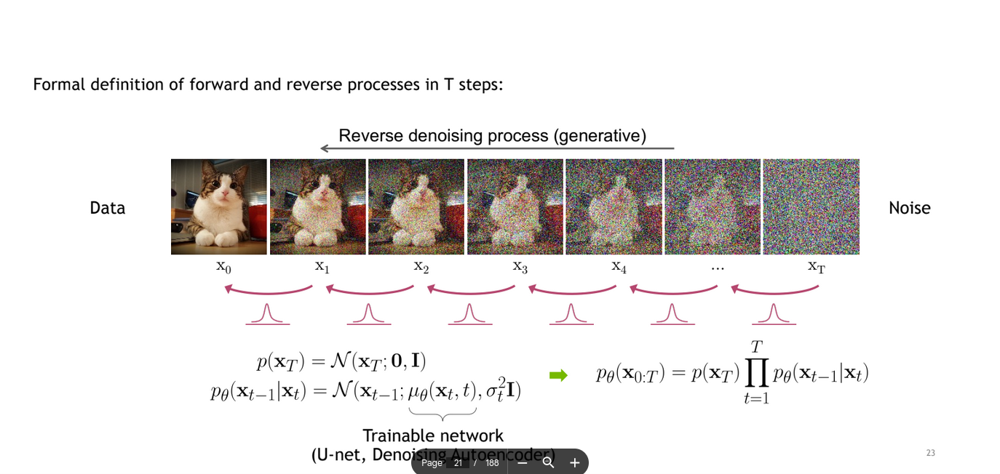

In [46]:
# @title
im8 = '/content/drive/MyDrive/COMPUTER_VISION/My_project_Diffusion_Models/FIGURES/c2.png'
Image(im8)

**2.4. Loss**

 As Diffusion models are similar to VAE and thus we can use the `variational lower bound to optimize the negative log-likelihood`.

 \begin{align}
 -\log p_\theta(\mathbf{x}_0)&\leq -\log p_\theta(\mathbf{x}_0)+D_{KL}\left(q(\mathbf{x}_{1:T}|\mathbf{x}_{0})||p_{\theta}(\mathbf{x}_{1:T}|\mathbf{x}_{0})\right)\\
 &= -\log p_\theta(\mathbf{x}_0)+\mathbb{E}_{\mathbf{x}_{1:T}\sim q(\mathbf{x}_{1:T}|\mathbf{x}_{0})}\left[\log\dfrac{q(\mathbf{x}_{1:T}|\mathbf{x}_{0})}{p_{\theta}(\mathbf{x}_{0:T}|\mathbf{x}_{0})/p_{\theta}(\mathbf{x}_{0})} \right]\\
 &= -\log p_\theta(\mathbf{x}_0)+\mathbb{E}_{q}\left[\log\dfrac{q(\mathbf{x}_{1:T}|\mathbf{x}_{0})}{p_{\theta}(\mathbf{x}_{0:T})}+\log p_{\theta}(\mathbf{x}_{0}) \right]\\
 &= \mathbb{E}_{q}\left[\log\dfrac{q(\mathbf{x}_{1:T}|\mathbf{x}_{0})}{p_{\theta}(\mathbf{x}_{0:T})}\right]\\
 \text{Let }& L_{VLB} =\mathbb{E}_{q}\left[\log\dfrac{q(\mathbf{x}_{1:T}|\mathbf{x}_{0})}{p_{\theta}(\mathbf{x}_{0:T})}\right]\geq -\mathbb{E}_{q(\mathbf{x}_{0})}\log p_{\theta}(\mathbf{x}_{0})\\
 \end{align}

In general, as a loss function we compute the KL-divergence (a metric for comparing the similarity of two distributions) between the ground truth reverse distribution $q(\mathbf{x}_{t-1}|\mathbf{x}_t, \mathbf{x}_0)$ and the models predicted distribution $p(\mathbf{x}_{t-1}|\mathbf{x}_t)$:

$$
\mathcal{L} = \text{KL}(q(\mathbf{x}_{t-1}|\mathbf{x}_t, \mathbf{x}_0)\ ||\ p(\mathbf{x}_{t-1}|\mathbf{x}_t))
$$

We can sample from this distribution using
the pseudocode in  the folowing Algorithms

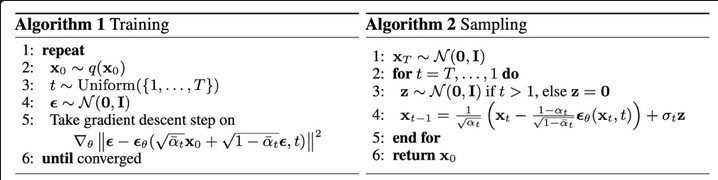

In [47]:
# @title
im8 = '/content/drive/MyDrive/COMPUTER_VISION/My_project_Diffusion_Models/FIGURES/summary.png'
Image(im8)

**2.5. CNN architecture**

The most common choice of NN architecture for image diffusion models is the [U-Net](https://arxiv.org/abs/1505.04597), which gets its name from the U-shape of the architecture as shown in the diagram below.

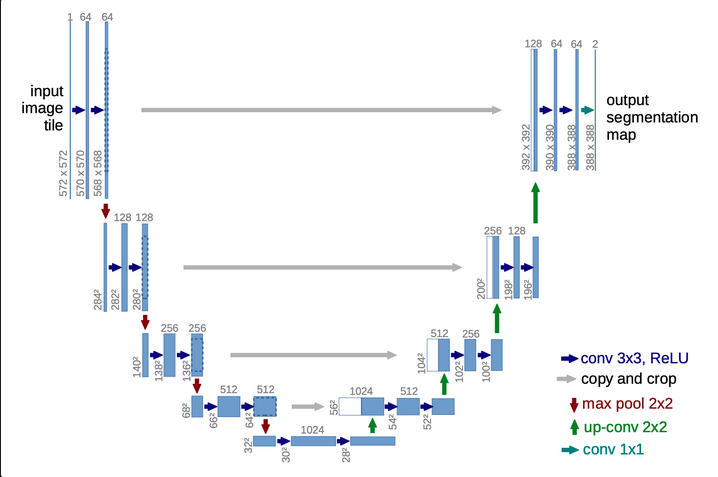

In [48]:
# @title
im10 = '/content/drive/MyDrive/COMPUTER_VISION/My_project_Diffusion_Models/FIGURES/unet.png'
Image(im10)

In a few words, a U-Net is a symmetric architecture with input and output of the same spatial size that uses skip connections between encoder and decoder blocks of corresponding feature dimension. Usually, the input image is first downsampled and then upsampled until reaching its initial size.

# **3. Implementation**

In [49]:
# @title 1. Import image
! git clone https://github.com/emmanuelnyandukagarabi/Diffusion-Models

fatal: destination path 'Diffusion-Models' already exists and is not an empty directory.


<ipython-input-50-d368f1824914>:16: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = torch.FloatTensor(imageio.imread(img_path)/255)


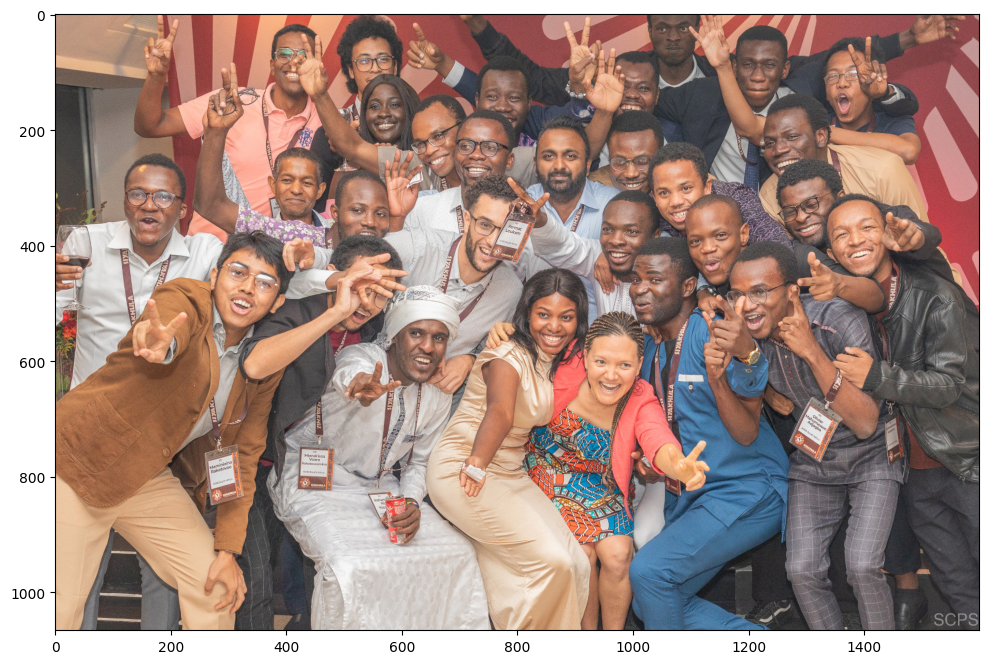

In [50]:
#@title 2.  Import Libraries
import sys
sys.path.append('./Diffusion-Models/')
import torch
import torch.nn.functional as F
import numpy as np
import jax.numpy as jnp
import matplotlib as mpl
import matplotlib.pyplot as plt
import imageio

mpl.rcParams['figure.figsize'] = (12, 8)
img_path = './Diffusion-Models/AIMS_AI_STREAM_2023_2024.png.jpg'

# Load image
img = torch.FloatTensor(imageio.imread(img_path)/255)
plt.imshow(img)


The majority of the diffusion models assume that the images are scaled to the [-1,+1]

In [51]:
# @title 3. Helper Functions.

def extract(a, t, x_shape):
    batch_size = x_shape[0]
    out = a[..., t]
    return jnp.reshape(out, (batch_size, *((1,) * (len(x_shape) - 1))))

def bivariate_normal(X, Y, sigmax=1.0, sigmay=1.0,
                 mux=0.0, muy=0.0, sigmaxy=0.0):
    """
    Bivariate Gaussian distribution for equal shape *X*, *Y*.
    See `bivariate normal
    <http://mathworld.wolfram.com/BivariateNormalDistribution.html>`_
    at mathworld.
    """
    Xmu = X-mux
    Ymu = Y-muy

    rho = sigmaxy/(sigmax*sigmay)
    z = Xmu**2/sigmax**2 + Ymu**2/sigmay**2 - 2*rho*Xmu*Ymu/(sigmax*sigmay)
    denom = 2*np.pi*sigmax*sigmay*np.sqrt(1-rho**2)
    return np.exp(-z/(2*(1-rho**2))) / denom


    #  Linear schedule
def linear_alpha_schedule(timesteps):
    alpha_start = 0.9999
    alpha_end = 0.98
    return jnp.linspace(alpha_start, alpha_end, timesteps)


    # ENCODER
def q_sample_one_timestep(x_tm1, t, noise):
    # `noise` is a gaussian random normal with mean 0 and variance 1
    alpha_t = extract(alphas, t, x_tm1.shape)

    return jnp.sqrt(alpha_t) * x_tm1 + (1 - alpha_t) * noise

# Forward diffusion - q(x_t|x_0):
def q_sample(x_start, t, noise):
    # `noise` is a gaussian random normal with mean 0 and variance 1
    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(sqrt_one_minus_alphas_cumprod, t, x_start.shape)

    return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

In [52]:
# We can choose this hyperparameter, but 200 seems to be the most common!
T = 200

# Define alpha schedule.
alphas = linear_alpha_schedule(timesteps=T)
betas = 1 - alphas

# Define alpha bar (alpha_cumprod), sqrt alpha bar, and sqrt(1 - alpha bar)
alphas_cumprod = jnp.cumprod(alphas, axis=0)
sqrt_alphas_cumprod = jnp.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = jnp.sqrt(1.0 - alphas_cumprod)

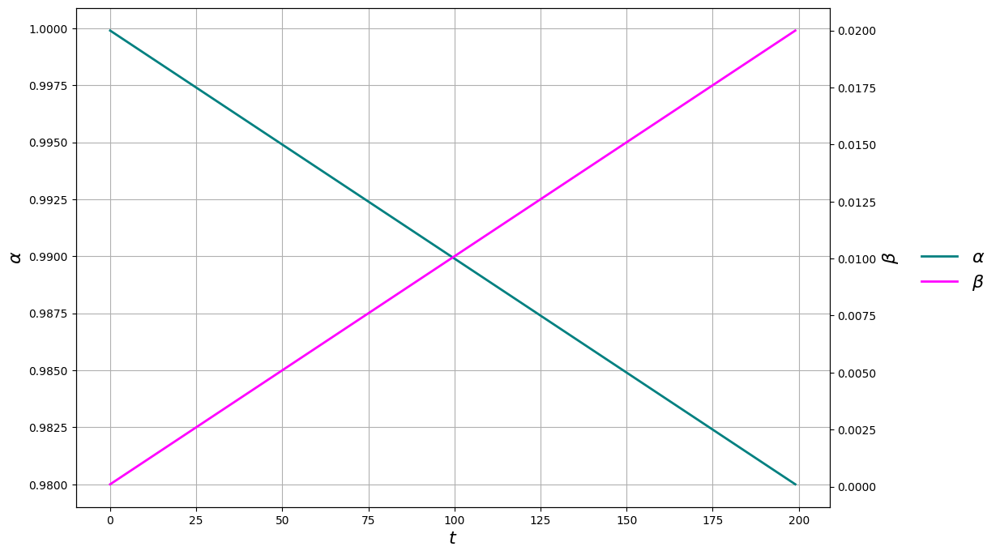

In [53]:
# Let's plot the linear schedule
fig, ax_a = plt.subplots()

ax_a.plot(alphas,color='teal',linewidth=2)
ax_a.set_xlabel("$t$", fontsize=16)
ax_a.set_ylabel(r'$\alpha$', fontsize=16)
ax_a.grid()

ax_b = ax_a.twinx()
ax_b.plot(betas, color='magenta',linewidth=2)
ax_b.set_ylabel(r'$\beta$',fontsize=16)
ax_a.legend([r'$\alpha$'], bbox_to_anchor=(1.1, 0.5), loc="center left",frameon=False,  fontsize=16)
ax_b.legend([r'$\beta$'], bbox_to_anchor=(1.1, 0.45), loc="center left",frameon=False,  fontsize=16)
plt.show()

In [54]:
import jax
x_0 = jnp.asarray(img, dtype=jnp.float32)[jnp.newaxis, ...]
#x_0 = x_0 / 255.0  # normalize the images to [0, 1]
x_0 = (x_0 * 2.0) - 1.0  # convert range to [-1, 1]

key = jax.random.PRNGKey(0)

x_t = x_0
x_t_history = [x_t] # Save the first image

for t in range(1, T+1):
    noise = jax.random.normal(key, x_t.shape)
    x_t = q_sample_one_timestep(x_t, t, noise)
    x_t_history.append(x_t)

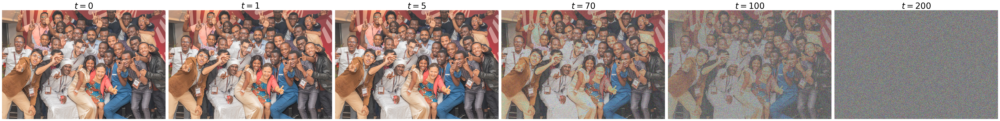

In [55]:
# @title Encoder in action
ts = [0,1, 5, 70, 100, 200]

num_cols = len(ts)
fig, axs = plt.subplots(figsize=(50, 50), nrows=1, ncols=num_cols, squeeze=False)
for i, t in enumerate(ts):

    # rescale image back to range 0-255
    noisy_image = (x_t_history[t] + 1.0) / 2.0
    noisy_image = noisy_image * 255.0
    noisy_image = np.array(noisy_image).astype(jnp.uint8)[0]

    ax = axs[0, i]
    ax.imshow(noisy_image)
    ax.set_title(f"$t={t}$", fontsize=30)

    # Remove axis labels and ticks
    ax.axis('off')

plt.tight_layout()

DECODER

# **4.Summary**
In this project, we conducted a review of denoising diffusion models. Generally, diffusion models operate in two steps: the Forward Diffusion Process (which involves adding noise to the data over a series of T steps) and the Reverse Diffusion Process (which aims to remove the noise from the data). In this case, a U-net is trained as the appropriate neural network architecture. The training of the model focuses on maximizing the evidence lower bound (ELBO).

# **5. References**
  - **Kevin P Murphy**.[Probabilistic machine learning : Advanced topics](https://mitpress.mit.edu/9780262048439/probabilistic-machine-learning/).
MIT press, 2023.
  -  **Karsten Kreis,Ruiqi Gao, and Arash Vahdat** : [Tutorial on Denoising Diffusion-based Generative Modeling: Foundations and Applications](https://cvpr2022-tutorial-diffusion-models.github.io/), 2022.
  - **Lilian Weng**, [What are Diffusion Models? ](https://lilianweng.github.io/posts/2021-07-11-diffusion-models/),  2011.
  -  [Awesome-Diffusion-Models](https://github.com/diff-usion/Awesome-Diffusion-Models?tab=readme-ov-file)
  -  **James Thornton** and **Valentin De Bortoli**, [What's the score?](https://scorebasedgenerativemodeling.github.io/)
  - **Kevin Eloff**,**Tom Makkink**, and **James Allingham**, [Diffusion Models: Building your own Stable Diffusion](https://github.com/deep-learning-indaba/indaba-pracs-2023/blob/main/practicals/diffusion_models.ipynb), Deep Learning Indaba 2023.

  - **James Allingham**, **Javier Antorán**, and **Ruan van der Merwe**, [Deep Generative Models](https://github.com/deep-learning-indaba/indaba-pracs-2022/blob/main/practicals/deep_generative_models.ipynb), Deep Learning Indaba 2022.
  




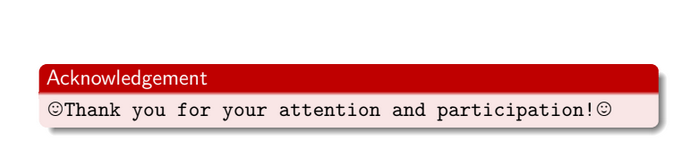

In [56]:
# @title
im_end = '/content/drive/MyDrive/COMPUTER_VISION/My_project_Diffusion_Models/FIGURES/thankyou.png'
Image(im_end)